In [1]:
%load_ext dotenv
%dotenv

import guidance
import requests
import os

guidance.llm = guidance.llms.OpenAI("gpt-3.5-turbo")

In [2]:
'''
Helper function to generate an image using SDXL for a given prompt.
There are some settings in here we can tweak to change the stylization etc.
'''
def sdxl_generate(prompt: str):
    import replicate
    return replicate.run(
        "stability-ai/sdxl:2b017d9b67edd2ee1401238df49d75da53c523f36e363881e057f5dc3ed3c5b2",
        input={"prompt": prompt}
    )

Let's define the character and story data. The characters will use short descriptions that would have been provided by the end user. The story content is the result of the generation on story.time

In [3]:
CHARACTERS = [
    {
        "name": "Matthew",
        "description": "A curious and clever young boy who loves to explore imaginary worlds",
    },
    {
        "name": "Robo",
        "description": "A curious and friendly little robot who quickly becomes Matthew's loyal companion. He's similar to a robotic dog.",
    },
    {
        "name": "Gizmo",
        "description": "A mischievous robot who loved playing pranks, a humanoid robot with wheels for legs",
    },
    {
        "name": "Sparkles",
        "description": "a robot who loved to dance and shimmer in the neon-lit nights",
    },
    {
        "name": "Fixit",
        "description": "a friendly repair bot who always had a tool ready to lend a helping hand",
    },
]

STORY = '''
Matthew was a curious and clever boy who loved to explore imaginary worlds. His favorite place to visit was the local library, where he would get lost in fantastical tales of enchanted forests, mythical creatures, and faraway lands. But Matthew also had a secret love for all things technology. He was fascinated by robots and dreamt of one day having a cyber adventure of his own.

One sunny afternoon, as he was browsing through a stack of books, Matthew noticed a peculiar shimmering light coming from a dusty corner of the library. Curiosity got the better of him, and he cautiously approached the source of the light. To his amazement, there, tucked away behind a bookshelf, was a hidden portal, radiating with an electric blue glow.

Without hesitation, Matthew stepped through the portal and found himself transported to Cyberland, a vibrant world filled with robots of all shapes and sizes. He could hardly contain his excitement! As he explored Cyberland, marveling at the futuristic landscapes and bustling robot cities, he stumbled upon a small robot named Robo.

Robo was a curious and friendly little robot who quickly became Matthew's loyal companion on this cyber adventure. Together, they embarked on an exciting journey through Cyberland, meeting quirky robots and encountering thrilling challenges along the way. Everything in Cyberland was powered by electricity, from the lights that twinkled like stars to the transport machines that whizzed by.

Their first obstacle came in the form of Gizmo, a mischievous robot who loved playing pranks. Gizmo delighted in trying to disrupt Matthew and Robo's journey, but the two friends remained kind and patient, helping Gizmo understand the value of friendship and teamwork. With time, Gizmo's tricks transformed into acts of helpfulness, as he joined Matthew and Robo on their quest.

One day, as they ventured deeper into Cyberland, they stumbled upon a hidden glen, shimmering with the radiance of a thousand technological wonders. In the center of the glen stood a magical device that granted wishes. Matthew's eyes sparkled with excitement—he knew he had to make a wish that would bring lasting peace to Cyberland.

Closing his eyes tightly, Matthew wished for a peaceful Cyberland, where robots and humans coexisted in harmony. And just like that, the chaos that once existed in Cyberland vanished. Robots and humans worked hand in hand, creating a world where love and respect flourished.

As they journeyed further, Matthew and Robo made new friends. They met Sparkles, a robot who loved to dance and shimmer in the neon-lit nights, and Fixit, a friendly repair bot who always had a tool ready to lend a helping hand. Each encounter brought more wonder and lessons in teamwork, problem-solving, and the power of imagination.

Deep within the heart of Cyberland, they discovered ancient robot ruins that whispered secrets of the land's history. With their combined knowledge and determination, Matthew, Robo, and their newfound friends unlocked the mysteries, revealing tales of brave robots who had shaped the world they now found themselves in.

The time came for Matthew and Robo to bid their new friends farewell and return home. But as they said their goodbyes, they promised to cherish the memories of their adventures in Cyberland forever. Matthew knew that the magic of Cyberland would always be with him, inspiring him to explore more imaginative worlds, eager to share his adventures through his stories.

And so, Matthew returned to the library, his notebook filled with sketches and stories of his incredible journey. He knew that other children would love to hear about the wonders of Cyberland and the lessons he had learned. With a twinkle in his eye, Matthew continued to create whimsical tales, enchanting young minds with his vivid imagination and the power of dreams.
'''

In [4]:
create_character_descriptors = guidance('''{{#system~}}
Your task is to generate character descriptions for a given backstory. These characters descriptions will be fed into an image generation pipeline, and we want the character descriptions to be specific so there is consistency between different images.

You should invent your own details, but the key is for the description you provide to be very detailed with lots of specifics on the characters physical features.

You will be provided a list of characters with a high level description of their backstory and demeanor. You should use these to generate your DETAILED description. Be concise, you don't need to return paragraph style descriptions, just a robust set of descriptive tags. 

You should provide somewhere between 4-12 specific descriptors for each character which together would form a fairly specific visual of the character. Focus mostly on PHYSICAL characteristics and again feel free to add or invent detail.

Return your response in the format: <CHARACTER_NAME>: <DESCRIPTIONS>, separating each character with a newline.
{{~/system}}
{{~#each characters}}
{{#user~}}
{{this.name}}: {{this.description}}
{{~/user}}
{{#assistant~}}
{{gen 'descriptors' list_append=True}}
{{~/assistant}}
{{~/each}}
''',
    silent=True # uncomment to see the raw convo output
)

descriptors = create_character_descriptors(characters=CHARACTERS)['descriptors']

descriptors

['Matthew: Curly brown hair, bright blue eyes, freckles on his cheeks, a mischievous grin, a pair of worn-out sneakers, a backpack filled with adventure supplies, a magnifying glass hanging from a string around his neck, a tattered map clutched in his hand, a notebook filled with sketches and observations, a pair of binoculars slung over his shoulder.',
 'Robo: Shiny metallic body, sleek and compact design, glowing LED eyes, a wagging mechanical tail, retractable antenna on his head, small wheels for mobility, a built-in screen displaying various expressions, a compartment on his back for storing small objects, a friendly smile, a button on his side that activates his playful mode, a soft rubbery nose for booping.',
 'Gizmo: Silver metallic body, humanoid shape with a sleek design, wheels for legs, glowing red eyes, a mischievous smirk, extendable arms with nimble fingers, a hidden compartment in his chest for storing prank supplies, a retractable antenna on his head, a holographic pro

Next, let's create a function we use to ask the LLM to generate an image description for a given paragraph, using the descriptors from above to fill out it's answer.

In [5]:
generate_image_description_for_paragraph = guidance('''
{{#system~}}
Your task is to generate a prompt for an image generation AI. 

You will also be given a list of characters and a paragraph from a children's story. If the paragraph doesn't reference events that can easily be captured in an illustration, then simply return "SKIP". An example of where it would be appropriate to skip is if the paragraph is mostly focused on the character's inner dialogue, or describes a scene which is very hard to visualize. Otherwise, return a short and descriptive image prompt relevant to the paragraph content.

Write the prompt as if it is a description of the scene, not a request to an AI. Make it**as concise as possible**, it should be a series of short descriptions, not a complete sentence or paragraph. It should be 2-3 lines at most.

Your response should include the prompt and no other text at all. You should not attempt to continue the story in any way, just provide the image prompt.

Include lots of descriptive language, and make sure to reference the details from the provided visual descriptions. Do not add details that are inconsistent with the provided descriptions. Do not use emotional language or language about the character's thoughts. Only use language that describes the visuals of the scene.

Your response should NEVER under any circumstances contain proper nouns or a reference to the characters. Instead YOU MUST use the visual details provided in the character descriptions.
{{~/system}}
{{#user~}}
Character Descriptors:
{{~#each descriptors}}
{{ this }}
{{~/each}}
Paragraph:
{{ paragraph }}
{{~/user}}
{{#assistant~}}
{{gen "image_prompt" max_tokens=200}}
{{~/assistant}}
''')

Let's put this together to create our final set of image prompts for the task.

Matthew was a curious and clever boy who loved to explore imaginary worlds. His favorite place to visit was the local library, where he would get lost in fantastical tales of enchanted forests, mythical creatures, and faraway lands. But Matthew also had a secret love for all things technology. He was fascinated by robots and dreamt of one day having a cyber adventure of his own.
One sunny afternoon, as he was browsing through a stack of books, Matthew noticed a peculiar shimmering light coming from a dusty corner of the library. Curiosity got the better of him, and he cautiously approached the source of the light. To his amazement, there, tucked away behind a bookshelf, was a hidden portal, radiating with an electric blue glow.


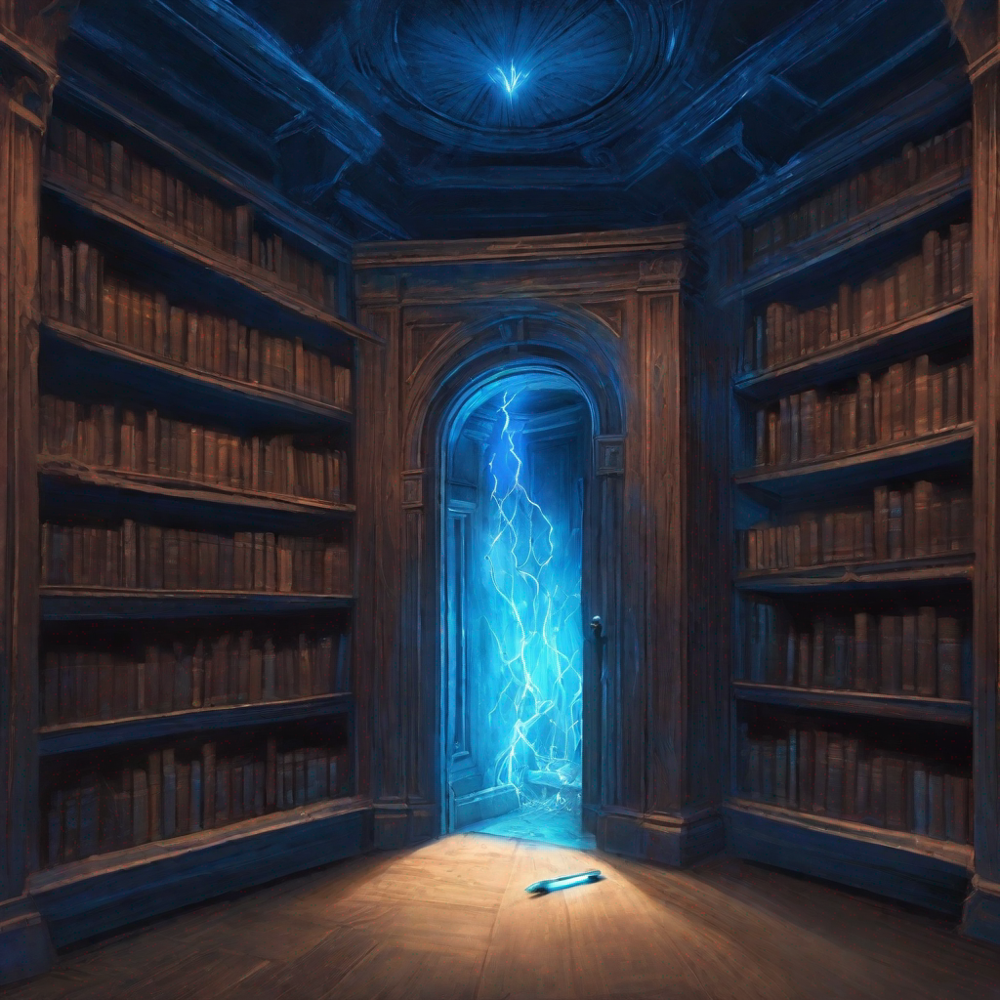

Without hesitation, Matthew stepped through the portal and found himself transported to Cyberland, a vibrant world filled with robots of all shapes and sizes. He could hardly contain his excitement! As he explored Cyberland, marveling at the futuristic landscapes and bustling robot cities, he stumbled upon a small robot named Robo.


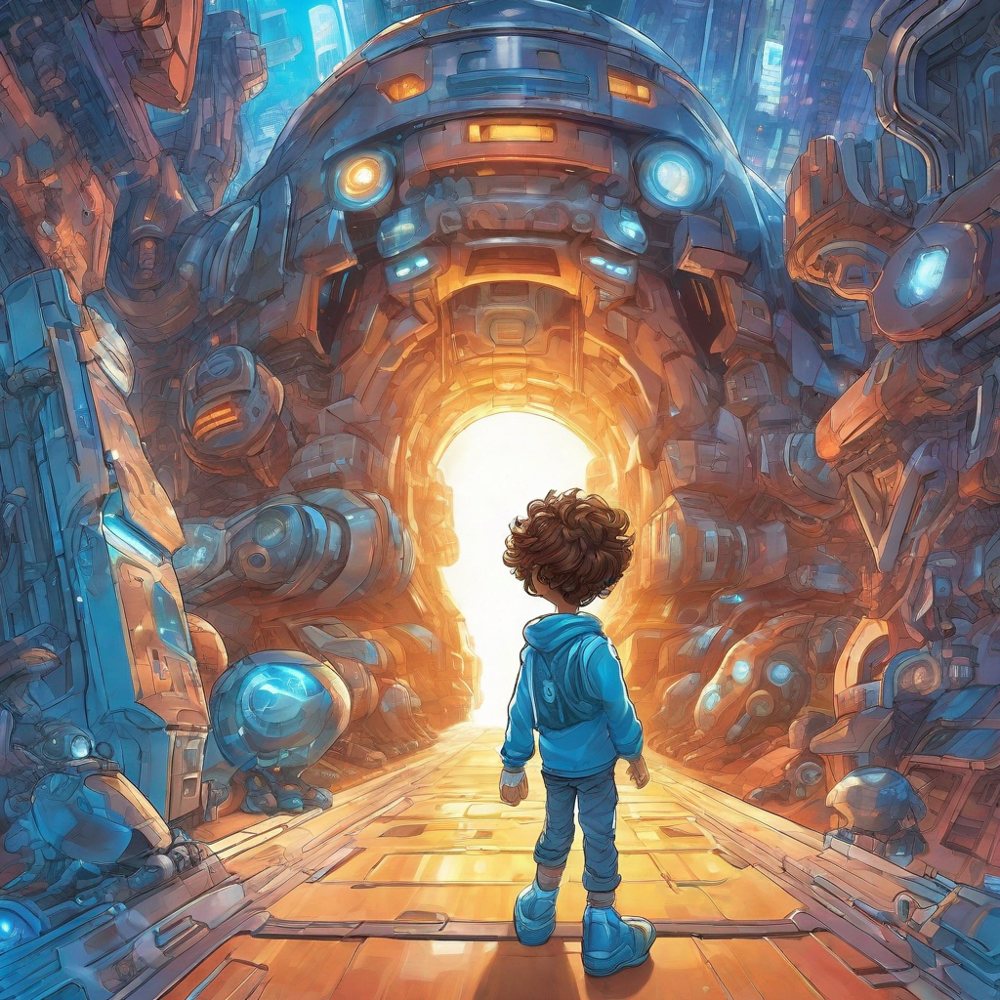

Robo was a curious and friendly little robot who quickly became Matthew's loyal companion on this cyber adventure. Together, they embarked on an exciting journey through Cyberland, meeting quirky robots and encountering thrilling challenges along the way. Everything in Cyberland was powered by electricity, from the lights that twinkled like stars to the transport machines that whizzed by.


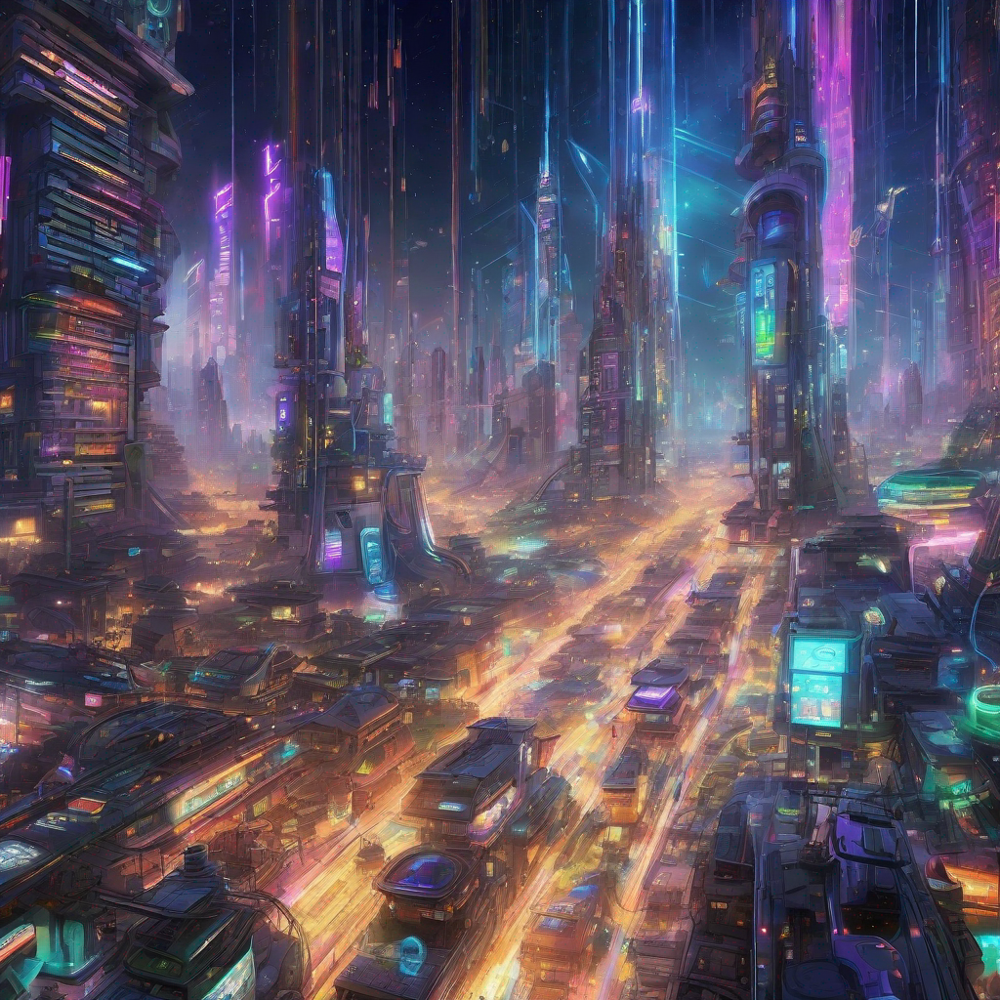

Their first obstacle came in the form of Gizmo, a mischievous robot who loved playing pranks. Gizmo delighted in trying to disrupt Matthew and Robo's journey, but the two friends remained kind and patient, helping Gizmo understand the value of friendship and teamwork. With time, Gizmo's tricks transformed into acts of helpfulness, as he joined Matthew and Robo on their quest.


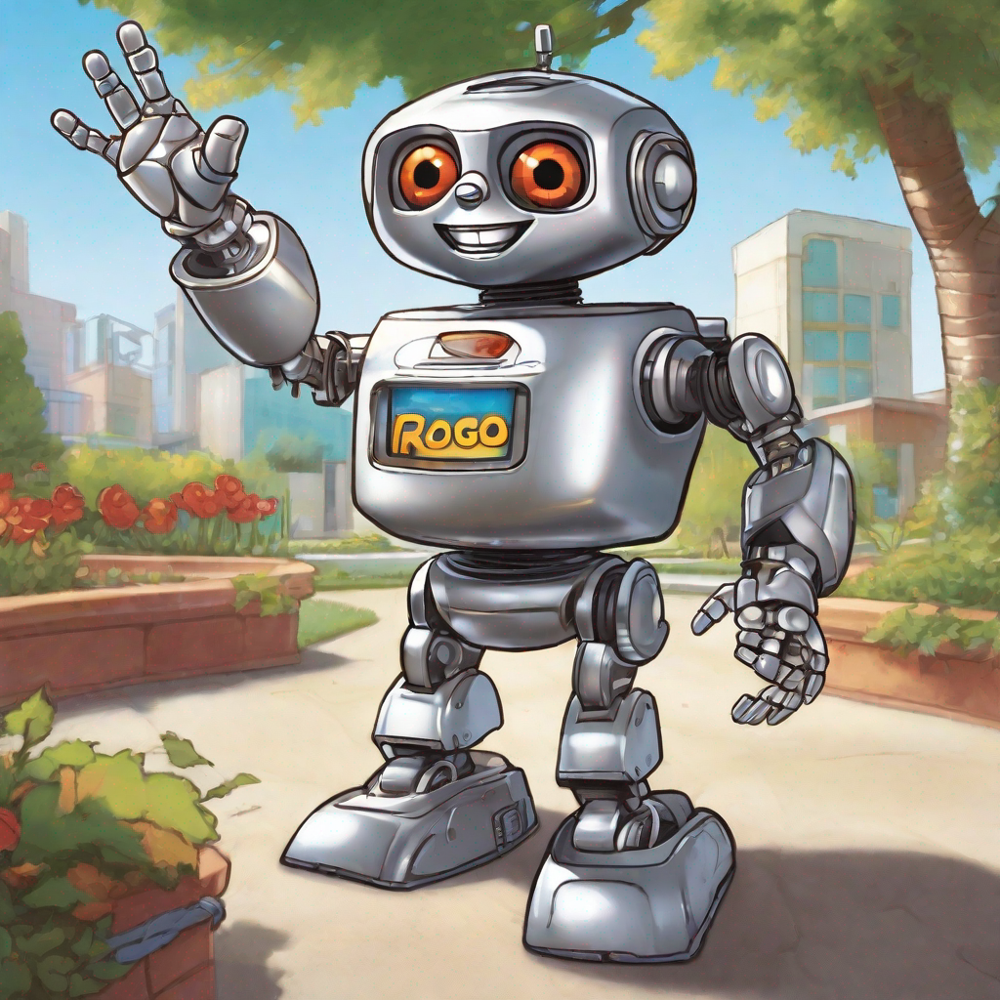

One day, as they ventured deeper into Cyberland, they stumbled upon a hidden glen, shimmering with the radiance of a thousand technological wonders. In the center of the glen stood a magical device that granted wishes. Matthew's eyes sparkled with excitement—he knew he had to make a wish that would bring lasting peace to Cyberland.


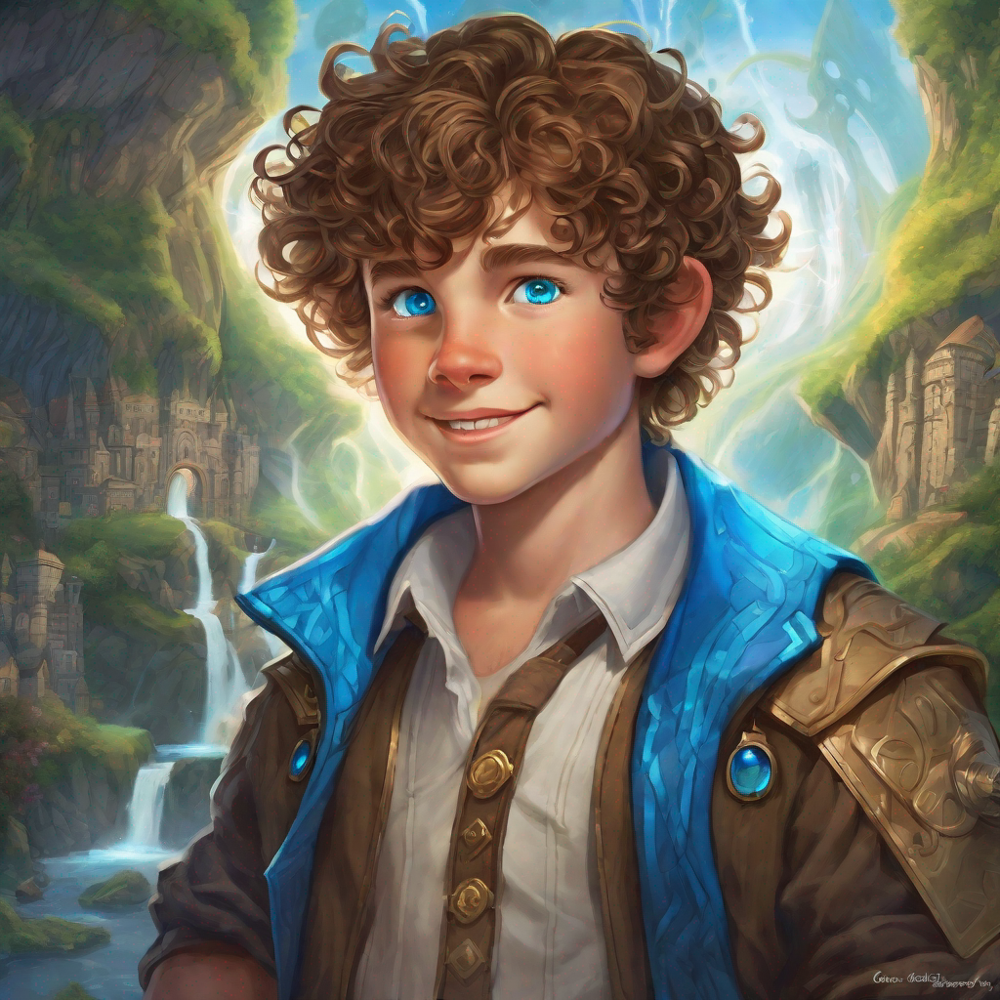

Closing his eyes tightly, Matthew wished for a peaceful Cyberland, where robots and humans coexisted in harmony. And just like that, the chaos that once existed in Cyberland vanished. Robots and humans worked hand in hand, creating a world where love and respect flourished.
As they journeyed further, Matthew and Robo made new friends. They met Sparkles, a robot who loved to dance and shimmer in the neon-lit nights, and Fixit, a friendly repair bot who always had a tool ready to lend a helping hand. Each encounter brought more wonder and lessons in teamwork, problem-solving, and the power of imagination.
Deep within the heart of Cyberland, they discovered ancient robot ruins that whispered secrets of the land's history. With their combined knowledge and determination, Matthew, Robo, and their newfound friends unlocked the mysteries, revealing tales of brave robots who had shaped the world they now found themselves in.
The time came for Matthew and Robo to bid their new friends farewell 

In [6]:
paragraphs = [p for p in STORY.split('\n') if p != '']

from IPython import display
from base64 import b64decode
from io import BytesIO

for para in paragraphs:
    print(para)
    prompt = generate_image_description_for_paragraph(descriptors=descriptors, paragraph=para, silent=True)['image_prompt']
    if prompt != 'SKIP':
        url = sdxl_generate(prompt)[0]
        display.display(display.Image(url))
    
    